In [1]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.cluster import Birch
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler

In [2]:
df = pd.read_excel('PorCorreo.xlsx')

In [3]:
n=2
if n==1:
    df=df[df['Primer_Compra']==0]
    #df.drop(columns=df.columns[6:-1], axis=1, inplace=True)
    df.drop(columns='Primer_Compra', axis=1, inplace=True)
elif n==2:
    df=df[df['SBol_Vend']>1]

df

,Unnamed: 0,EMAIL,SBol_Vend,Prom_Pagado,Sum_Pagado,%_Promo,Prom_Horas_Ant,Venta_Ant,Recencia,PAGO_EFECTIVO,PAGO_TARJETA,DESC_ADULTO,DESC_DISCAPACIDAD,DESC_ESTUDIANTE,DESC_MENOR,DESC_PETFRIENDLY,DESC_PROFESOR,DESC_PROMOCION ESPECIAL,DESC_SENECTUD
0,0,00-MAZA.ESQUISTOSO@ICLOUD.COM,4,953.664978,3814.659912,6.25,2.5,0.750000,187,1,0,0,0,0,0,0,0,1,0
3,3,0022ANDREAGONZALEZ@GMAIL.COM,2,504.309998,1008.619995,0.00,24.5,0.500000,778,0,1,0,0,1,0,0,0,0,0
7,7,01MENDEZ.CESAR@GMAIL.COM,9,1112.066772,10008.600586,5.00,10.0,1.000000,180,0,1,0,0,0,0,0,0,1,0
10,10,0209396@UP.ED.MX,2,1034.479980,2068.959961,5.00,4.0,1.000000,795,0,1,1,0,0,0,0,0,0,0
11,11,0209396@UP.EDU.MX,8,892.562500,7140.500000,10.00,7.5,0.500000,684,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137005,137005,zorobabel@ejemplo.com,2,1183.189941,2366.379883,0.00,3.5,0.000000,380,1,0,1,0,0,0,0,0,0,0
137018,137018,zulma.pilar.herrera.cortes@ejemplo.com,2,1012.930054,2025.860107,0.00,2.0,0.000000,769,1,0,1,0,0,0,0,0,0,0
137023,137023,zuri.alejandra@ejemplo.com,3,1198.280029,3594.840088,0.00,42.0,0.666667,289,1,0,1,0,0,0,0,0,0,0
137031,137031,zuriel.hernández.lópez@ejemplo.com,2,880.599976,1761.199951,10.00,2.0,0.000000,991,1,0,0,0,0,0,0,0,1,0


In [4]:
df=df[df.columns[1:]]
X = df[df.columns[1:]]

X.head()

,SBol_Vend,Prom_Pagado,Sum_Pagado,%_Promo,Prom_Horas_Ant,Venta_Ant,Recencia,PAGO_EFECTIVO,PAGO_TARJETA,DESC_ADULTO,DESC_DISCAPACIDAD,DESC_ESTUDIANTE,DESC_MENOR,DESC_PETFRIENDLY,DESC_PROFESOR,DESC_PROMOCION ESPECIAL,DESC_SENECTUD
0,4,953.664978,3814.659912,6.25,2.5,0.75,187,1,0,0,0,0,0,0,0,1,0
3,2,504.309998,1008.619995,0.00,24.5,0.50,778,0,1,0,0,1,0,0,0,0,0
7,9,1112.066772,10008.600586,5.00,10.0,1.00,180,0,1,0,0,0,0,0,0,1,0
10,2,1034.479980,2068.959961,5.00,4.0,1.00,795,0,1,1,0,0,0,0,0,0,0
11,8,892.562500,7140.500000,10.00,7.5,0.50,684,0,1,0,0,0,0,0,0,1,0


In [5]:
m=1
if m==0:# genera dos
    # 1. Crea una instancia del escalador estándar
    scaler = StandardScaler()
    
    # 2. Aplica el ajuste y la transformación
    X_escalado = scaler.fit_transform(X)
    figname='2d_pca_clustersBirchSS.png'
elif m==1:
    # 1. Crea una instancia del escalador robusto
    robust_scaler = RobustScaler()
    
    # 2. Aplica el ajuste y la transformación
    X_escalado = robust_scaler.fit_transform(X)
    figname='2d_pca_clustersBirchRS.png'
elif m==2:
    # 1. Crea una instancia del escalador Min-Max
    minmax_scaler = MinMaxScaler()
    
    # 2. Aplica el ajuste y la transformación
    X_escalado = minmax_scaler.fit_transform(X)
    figname='2d_pca_clustersBirchMM.png'
    
# Elegir un valor para min_samples (por ejemplo, 2 veces el número de dimensiones)
min_samples_val = 2*len(X.columns)

In [6]:
# 3. ENCONTRAR LA K ÓPTIMA USANDO EL COEFICIENTE DE SILUETA CON BIRCH
max_silhouette_score = -1
optimal_k = 0
K_range = range(2, 11)

for k in K_range:
    birch_model = Birch(n_clusters=k)
    birch_model.fit(X_escalado)
    if len(np.unique(birch_model.labels_)) > 1:
        score = silhouette_score(X_escalado, birch_model.labels_)
        if score > max_silhouette_score:
            max_silhouette_score = score
            optimal_k = k
print(f"\nEl número óptimo de clusters (K) es: {optimal_k}")

# 4. ENTRENAR EL MODELO BIRCH FINAL Y ASIGNAR LOS CLÚSTERES
birch_final = Birch(n_clusters=optimal_k)
birch_final.fit(X_escalado)
df['Cluster'] = birch_final.labels_

# 5. ANALIZAR EL PERFIL DE CADA CLÚSTER
cluster_profile = df.groupby('Cluster')[df.columns[1:]].mean().round(2)
print("\n--- Perfil promedio de cada Cluster (usando BIRCH) ---")
print(cluster_profile)


El número óptimo de clusters (K) es: 2

--- Perfil promedio de cada Cluster (usando BIRCH) ---
         SBol_Vend  Prom_Pagado  Sum_Pagado  %_Promo  Prom_Horas_Ant  \
Cluster                                                                
0              5.1       898.41     4614.32      3.5          100.40   
1           1095.5      1087.20  1191650.62      1.7           39.31   

         Venta_Ant  Recencia  PAGO_EFECTIVO  PAGO_TARJETA  DESC_ADULTO  \
Cluster                                                                  
0             0.63    442.27           0.32          0.68         0.36   
1             0.51      3.00           0.50          0.50         0.50   

         DESC_DISCAPACIDAD  DESC_ESTUDIANTE  DESC_MENOR  DESC_PETFRIENDLY  \
Cluster                                                                     
0                     0.01             0.03        0.05               0.0   
1                     0.00             0.00        0.00               0.0   

         

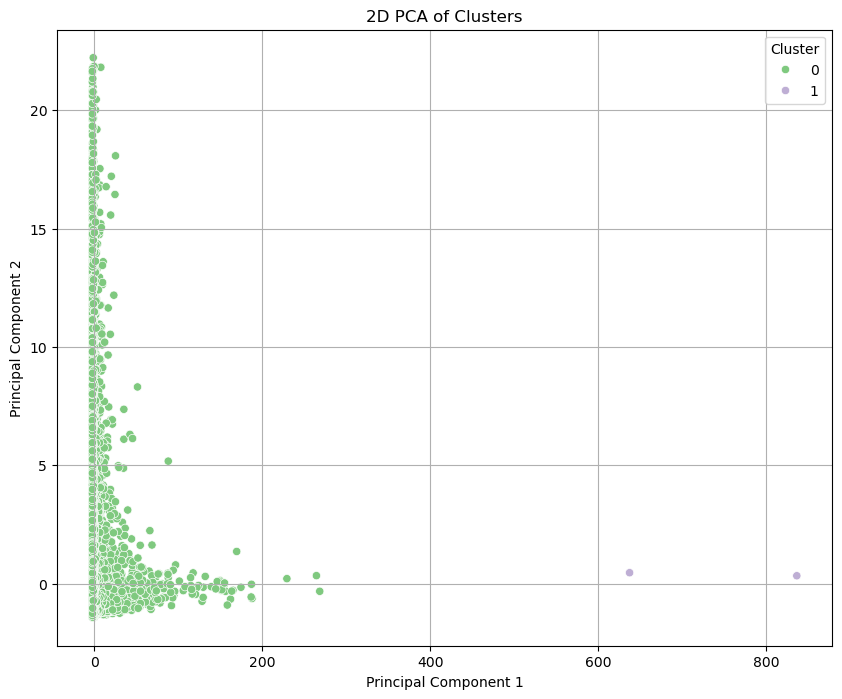

In [7]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Perform PCA to reduce to 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_escalado) # Assuming X_escalado is your scaled data

# Create a new DataFrame with the PCA results and cluster labels
pca_df = pd.DataFrame(data = X_pca, columns = ['principal component 1', 'principal component 2'])
pca_df['Cluster'] = df['Cluster'].values

# Visualize the clusters in 2D
plt.figure(figsize=(10, 8))
sns.scatterplot(x='principal component 1', y='principal component 2', hue='Cluster', data=pca_df, palette="Accent", legend='full')
plt.title('2D PCA of Clusters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
# Save the plot as a PNG file
plt.savefig(figname)

plt.show()

In [8]:
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np

# Asumimos que X_escalado ya existe y tiene nombres de columnas (si no, usa X.columns)
# Ejemplo: si X_escalado es un array de numpy, necesitamos los nombres de las características originales.
# Si X es un DataFrame de Pandas:
# nombres_originales = X.columns
# Si X es un array de numpy con 5 columnas:
# nombres_originales = [f'feature_{i+1}' for i in range(X_escalado.shape[1])]

# IMPORTANTE: Asegúrate de reemplazar 'X.columns' si tus datos originales no son un DataFrame
try:
    nombres_originales = X.columns  # Intenta obtener nombres de un DataFrame
except AttributeError:
    # Si X es un array de numpy, usa la forma de abajo para obtener el número de columnas
    nombres_originales = [f'Variable_{i+1}' for i in range(X_escalado.shape[1])]


# 1. Ejecutar PCA con TODAS las componentes posibles
pca = PCA(n_components=None)
pca.fit(X_escalado)

# --- 1. RESUMEN DE VARIANZA (Igual que antes) ---

# Extraer la información clave
varianza_individual = pca.explained_variance_ratio_
varianza_acumulada = np.cumsum(varianza_individual)
nombres_componentes = [f'CP{i+1}' for i in range(len(varianza_individual))]

# Crear el DataFrame de resumen de varianza
df_pca_resumen = pd.DataFrame({
    'Componente Principal': nombres_componentes,
    'Varianza Explicada (%)': varianza_individual * 100,
    'Varianza Acumulada (%)': varianza_acumulada * 100
})

print("## 1. Resumen de la Varianza Explicada por Componente")
# Usamos to_string() para asegurar la impresión en consola
print(df_pca_resumen.head(10).style.format({
    'Varianza Explicada (%)': "{:.2f}%",
    'Varianza Acumulada (%)': "{:.2f}%"
}).to_string())

# ----------------------------------------------------
# --- 2. CARGAS (LOADINGS) DE LAS COMPONENTES ---

# La matriz de cargas (loadings) se encuentra en pca.components_
# Esto nos dice cómo se relaciona cada variable original con cada CP.
cargas_pca = pca.components_

# 4. Crear el DataFrame de cargas
# Las filas son las Componentes Principales (CP1, CP2, etc.)
# Las columnas son las Variables Originales
df_cargas = pd.DataFrame(
    cargas_pca.T,
    columns=nombres_componentes,
    index=nombres_originales
)

# 5. Mostrar la tabla de cargas (usamos las 3-5 primeras componentes para interpretación)
print("\n" + "="*50)
print("## 2. Contribución de Variables a las Componentes Principales (Loadings)")
print("Los valores cercanos a 1 o -1 indican una fuerte contribución.")

# Mostraremos solo las primeras 5 componentes para facilitar la lectura
df_cargas

## 1. Resumen de la Varianza Explicada por Componente
 Componente Principal Varianza Explicada (%) Varianza Acumulada (%)
0 CP1 89.60% 89.60%
1 CP2 6.62% 96.22%
2 CP3 1.25% 97.47%
3 CP4 0.85% 98.32%
4 CP5 0.50% 98.82%
5 CP6 0.42% 99.24%
6 CP7 0.24% 99.48%
7 CP8 0.21% 99.69%
8 CP9 0.11% 99.80%
9 CP10 0.08% 99.87%


## 2. Contribución de Variables a las Componentes Principales (Loadings)
Los valores cercanos a 1 o -1 indican una fuerte contribución.


,CP1,CP2,CP3,CP4,CP5,CP6,CP7,CP8,CP9,CP10,CP11,CP12,CP13,CP14,CP15,CP16,CP17
SBol_Vend,0.764624,0.028053,-0.042794,-0.228252,-0.031069,-0.090303,-0.274158,-0.514239,-0.099614,-0.033240,-0.028240,0.009073,0.000760,0.000339,0.000254,2.203073e-17,3.797224e-17
Prom_Pagado,0.003951,-0.104660,0.169804,0.797957,-0.076502,0.107062,0.027854,-0.317780,-0.332320,0.034840,-0.300557,0.044126,0.004293,-0.020766,-0.002216,8.222703e-17,2.096461e-16
Sum_Pagado,0.644396,-0.028532,0.048525,0.263003,0.045121,0.116041,0.325821,0.612184,0.115386,0.039010,0.032314,-0.010247,-0.000733,-0.000416,-0.000284,-2.525835e-17,-4.198039e-17
%_Promo,0.000324,-0.062324,0.666902,-0.037206,0.391669,-0.060680,0.070756,-0.193833,0.547060,0.099788,-0.202588,0.005258,0.002472,-0.000150,-0.000988,-3.950113e-17,-8.775237e-16
Prom_Horas_Ant,-0.002623,0.986299,0.075086,0.118936,0.066289,-0.015502,-0.045230,0.017383,-0.013338,-0.002915,-0.015025,0.004972,0.001510,-0.001061,-0.000128,5.550183e-18,1.055907e-17
Venta_Ant,-0.000180,0.088315,0.006378,-0.234363,-0.256691,0.003231,0.869682,-0.320043,-0.081019,-0.012980,-0.075596,-0.003175,0.004285,-0.009027,-0.001666,1.397186e-16,-1.463509e-16
Recencia,-0.008759,-0.000499,0.037263,-0.235029,0.507314,0.740075,0.038837,-0.019334,-0.366848,-0.006872,-0.036319,0.017644,0.004267,-0.007869,-0.000499,8.120632e-17,2.562421e-16
PAGO_EFECTIVO,-0.000613,-0.021841,-0.291729,0.107564,0.503041,-0.337145,0.155501,-0.069265,-0.066219,0.005820,0.045505,0.024495,0.007830,-0.000620,0.000624,7.070864e-01,-5.366682e-03
PAGO_TARJETA,0.000613,0.021841,0.291729,-0.107564,-0.503041,0.337145,-0.155501,0.069265,0.066219,-0.005820,-0.045505,-0.024495,-0.007830,0.000620,-0.000624,7.070864e-01,-5.366682e-03
DESC_ADULTO,0.000303,0.021049,-0.341713,0.259574,-0.007946,0.369060,0.036842,-0.288839,0.507494,-0.015132,0.340487,-0.185285,-0.211593,-0.023118,-0.126529,2.683341e-03,3.535432e-01


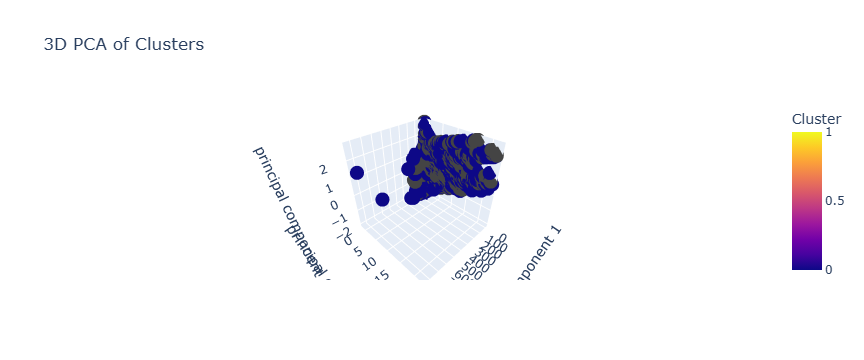

In [9]:
from sklearn.decomposition import PCA
import plotly.express as px

# Perform PCA to reduce to 3 dimensions
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_escalado) # Assuming X_escalado is your scaled data

# Create a new DataFrame with the 3D PCA results and cluster labels
pca_df_3d = pd.DataFrame(data = X_pca_3d, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
pca_df_3d['Cluster'] = df['Cluster'] # Assuming df has the 'Cluster' column

# Visualize the clusters in 3D using Plotly
fig = px.scatter_3d(pca_df_3d,
                    x='principal component 1',
                    y='principal component 2',
                    z='principal component 3',
                    color='Cluster',
                    title='3D PCA of Clusters')
fig.show()

In [10]:
num=1;
if num==1:
    df_correo.to_excel('PorCorreo.xlsx')
    Df.to_excel('ventas.xlsx')

NameError: name 'df_correo' is not defined